In [3]:
# At the beginning of the notebook
import logging
import sys
logger = logging.getLogger('planet4')
ch = logging.StreamHandler(sys.stderr)
# fmt = logging.Formatter('%(name)s - %(message)s')
fmt = logging.Formatter('%(message)s')
ch.setFormatter(fmt)
logger.addHandler(ch)

In [4]:
logger.setLevel(logging.DEBUG)

In [5]:
%matplotlib nbagg

In [6]:
from planet4.fnotching import get_clusters_in_path, data_to_centers, cdist, fnotch_image_ids
from planet4 import region_data, dbscan, io, markings

In [7]:
obsid = region_data.Ithaca.season2[-1]
obsid

'ESP_012858_0855'

In [4]:
scanner = dbscan.DBScanner()

In [5]:
scanner.cluster_image_name(obsid)

APF0000bz8
APF0000c10
APF0000c0z
APF0000c0e
APF0000bza
APF0000bzm
APF0000c03
APF0000c15
APF0000c0q
APF0000bzh
APF0000c0s
APF0000c0x
APF0000c0g
APF0000bzo
APF0000c0i
APF0000bze
APF0000bzg
APF0000c14
APF0000c13
APF0000c01
APF0000bz7
APF0000bzq
APF0000bzt
APF0000c0a
APF0000bzj
APF0000c0r
APF0000c0u
APF0000bzs
APF0000c09
APF0000c0b
APF0000c0j
APF0000c05
APF0000bzu
APF0000bzw
APF0000c0f
APF0000c04
APF0000bzv
APF0000bzz
APF0000bzp
APF0000bzb
APF0000bzf
APF0000c08
APF0000bzl
APF0000c0t
APF0000c0h
APF0000bzi
APF0000c0o
APF0000c0w
APF0000bzn
APF0000c02
APF0000c06
APF0000bzy
APF0000bzc
APF0000c00
APF0000bz6
APF0000bzx
APF0000c11
APF0000bzd
APF0000c12
APF0000c0d
APF0000bz9
APF0000c0c
APF0000bzk
APF0000c0l
APF0000c07
APF0000bzr
APF0000c0k
APF0000c0p
APF0000c0y
APF0000c0m
APF0000c0v
APF0000c0n


In [14]:
pm = io.PathManager('10p')

In [12]:
paths = pm.get_obsid_paths('L1A')

Entering obsid setting.
Obsid found: ESP_013113_0985


In [13]:
paths[1]

PosixPath('/Users/klay6683/Dropbox/data/planet4/clustering/ESP_013113_0985/APF000010l/L1A')

In [15]:
pm.blotchfile.parent

Entering obsid setting.
Obsid found: ESP_013113_0985


PosixPath('/Users/klay6683/Dropbox/data/planet4/clustering/ESP_013113_0985/APF000010p/L1A')

In [16]:
fans, blotches = get_clusters_in_path(pm.blotchfile.parent)

In [17]:
blotches

,x_tile,y_tile,x,y,image_x,image_y,radius_1,radius_2,distance,angle,spread,version,x_angle,y_angle,n_votes,image_id,image_name
0,2.0,55.0,53.066666,46.333333,793.066666,29638.333333,46.001907,31.210464,NaN,49.045574,NaN,NaN,0.642354,0.729690,6,APF000010p,ESP_013113_0985
1,2.0,55.0,142.399999,17.666667,882.399999,29609.666667,28.289581,20.650283,NaN,1.620530,NaN,NaN,0.665965,0.153026,6,APF000010p,ESP_013113_0985


In [18]:
fans

,x_tile,y_tile,x,y,image_x,image_y,radius_1,radius_2,distance,angle,spread,version,x_angle,y_angle,n_votes,image_id,image_name
0,2.0,55.0,67.70,73.2,807.70,29665.2,NaN,NaN,77.620267,233.733424,20.251862,1.0,-0.590805,-0.805268,5,APF000010p,ESP_013113_0985
1,2.0,55.0,15.25,5.5,755.25,29597.5,NaN,NaN,97.493570,50.732862,33.738506,1.0,0.632133,0.773220,4,APF000010p,ESP_013113_0985


### Opposing fans cleaning

In [26]:
from planet4.fnotching import get_id_from_path

In [20]:
from scipy.spatial.distance import pdist

In [27]:
paths = pm.get_obsid_paths('L1A')

In [39]:
pm.id

'APF000010p'

In [120]:
import random

In [136]:
random.randint(0,1)

0

In [59]:
from IPython.display import display

In [ ]:
for path in paths:
    pm.id = get_id_from_path(path)
    try:
        angle_diffs = pdist(pm.fandf.angle[:, None])  # add dimension to get (n, 1) array.
    except FileNotFoundError:
        continue
    within_180 = np.where(np.abs(angle_diffs - 180) < 5, True, False)
    if any(within_180):
        print(pm.id)
        display(pm.fandf)

In [62]:
pm.id = '139'

In [63]:
fans, blotches = get_clusters_in_path(pm.fanfile.parent)

In [64]:
fans

,x_tile,y_tile,x,y,image_x,image_y,radius_1,radius_2,distance,angle,spread,version,x_angle,y_angle,n_votes,image_id,image_name
0,2.0,1.0,347.901852,454.814815,1087.901852,454.814815,NaN,NaN,70.047251,217.840887,17.427962,1.0,-0.789279,-0.613130,27,APF0000139,ESP_013113_0985
1,2.0,1.0,443.609615,535.692308,1183.609615,535.692308,NaN,NaN,65.934742,219.196159,18.740268,1.0,-0.774194,-0.631331,26,APF0000139,ESP_013113_0985
2,2.0,1.0,457.457407,200.777778,1197.457407,200.777778,NaN,NaN,91.263250,223.501999,38.082269,1.0,-0.724614,-0.687681,27,APF0000139,ESP_013113_0985
3,2.0,1.0,592.714286,498.714286,1332.714286,498.714286,NaN,NaN,43.994749,209.692019,23.966268,1.0,-0.867050,-0.494397,7,APF0000139,ESP_013113_0985
4,2.0,1.0,387.388889,177.666667,1127.388889,177.666667,NaN,NaN,25.332363,214.337152,9.499050,1.0,-0.823839,-0.562768,9,APF0000139,ESP_013113_0985
5,2.0,1.0,556.916667,405.833333,1296.916667,405.833333,NaN,NaN,29.794469,207.263942,16.169735,1.0,-0.887513,-0.457372,6,APF0000139,ESP_013113_0985
6,2.0,1.0,554.600000,473.400000,1294.600000,473.400000,NaN,NaN,44.761521,30.651220,16.504680,1.0,0.858497,0.508750,5,APF0000139,ESP_013113_0985
7,2.0,1.0,464.642857,581.857143,1204.642857,581.857143,NaN,NaN,24.385385,215.082327,33.535528,1.0,-0.814408,-0.572000,7,APF0000139,ESP_013113_0985


In [106]:
fans.loc[[3, 6]]

,x_tile,y_tile,x,y,image_x,image_y,radius_1,radius_2,distance,angle,spread,version,x_angle,y_angle,n_votes,image_id,image_name
3,2.0,1.0,592.714286,498.714286,1332.714286,498.714286,NaN,NaN,43.994749,209.692019,23.966268,1.0,-0.867050,-0.494397,7,APF0000139,ESP_013113_0985
6,2.0,1.0,554.600000,473.400000,1294.600000,473.400000,NaN,NaN,44.761521,30.651220,16.504680,1.0,0.858497,0.508750,5,APF0000139,ESP_013113_0985


In [115]:
distances = pdist(data_to_centers(fans))
distances

array([ 127.31055804,  284.39326728,  259.08936101,  268.71254521,
        226.18971254,  259.29418716,  195.12824242,  346.64019729,
        157.81666612,  346.53457374,  170.88884292,  159.06370087,
         70.25691389,  353.18916114,   46.10450468,  260.53986361,
        351.07762161,  407.80595246,  372.9883582 ,   93.50944962,
          2.81281987,  147.34931788,  282.78122826,  371.10389237,
        411.46157968,   91.20600061,  197.02643322,  149.58164918])

In [211]:
import math

def calc_indices_from_index(n, c):
    n= math.ceil(math.sqrt(2* n))
    ti= np.triu_indices(n, 1)
    return ti[0][c][0], ti[1][c][0]

def fan_opposites(fans, eps=20):
    """Find fans that have opposite orientation and remove lower voted one.

    First check if any fans are close enough to be fnotched (same criteria
    as blotch-fan fnotching), then check if any of those have opposite orientation.
    Delete the one with lower votes.
    If number of votes is equal, take a random choice.

    Parameters
    ----------
    fans : pd.DataFrame
        Fan marking data
    eps : int

    Returns
    -------
    pd.DataFrame
        Data with opposing fans removed.
    """
    distances = pdist(data_to_centers(fans))
    close_indices = np.where(distances < eps)[0]
    ind_to_remove = []
    for index in close_indices:
        fan_indices = calc_indices_from_index(len(distances), index)
        # use squeeze() to force creation of pd.Series from 1D dataframe
        f1 = fans.iloc[fan_indices[0]].squeeze()
        f2 = fans.iloc[fan_indices[1]].squeeze()
        angle_diff = f1.angle - f2.angle
        # if they differ by between 175 and 185:
        if abs(angle_diff - 180) < 5:
            if f1.n_votes < f2.n_votes:
                ind_to_remove.append(fan_indices[0])
            elif f1.n_votes > f2.n_votes:
                ind_to_remove.append(fan_indices[1])
            else:
                ind_to_remove.append(fan_indices[random.randint(0, 1)])
    return ind_to_remove


In [195]:
pm.obsid

'ESP_013113_0985'

In [189]:
to_drop = fan_opposites(fans)

In [191]:
to_drop.append(3)

In [192]:
to_drop

[6, 3]

In [193]:
fans.drop(to_drop)

,x_tile,y_tile,x,y,image_x,image_y,radius_1,radius_2,distance,angle,spread,version,x_angle,y_angle,n_votes,image_id,image_name
0,2.0,1.0,347.901852,454.814815,1087.901852,454.814815,NaN,NaN,70.047251,217.840887,17.427962,1.0,-0.789279,-0.613130,27,APF0000139,ESP_013113_0985
1,2.0,1.0,443.609615,535.692308,1183.609615,535.692308,NaN,NaN,65.934742,219.196159,18.740268,1.0,-0.774194,-0.631331,26,APF0000139,ESP_013113_0985
2,2.0,1.0,457.457407,200.777778,1197.457407,200.777778,NaN,NaN,91.263250,223.501999,38.082269,1.0,-0.724614,-0.687681,27,APF0000139,ESP_013113_0985
4,2.0,1.0,387.388889,177.666667,1127.388889,177.666667,NaN,NaN,25.332363,214.337152,9.499050,1.0,-0.823839,-0.562768,9,APF0000139,ESP_013113_0985
5,2.0,1.0,556.916667,405.833333,1296.916667,405.833333,NaN,NaN,29.794469,207.263942,16.169735,1.0,-0.887513,-0.457372,6,APF0000139,ESP_013113_0985
7,2.0,1.0,464.642857,581.857143,1204.642857,581.857143,NaN,NaN,24.385385,215.082327,33.535528,1.0,-0.814408,-0.572000,7,APF0000139,ESP_013113_0985


In [170]:
f1.squeeze().angle - f2.squeeze().angle

179.04079872584424

In [141]:
pdist(data_to_centers(fans))

(28,)

In [29]:
data_to_centers(fans)

array([[   784.43392847,  29633.48832509],
       [   787.1681798 ,  29636.5420609 ]])

In [24]:
data_to_centers(blotches)

array([[   962.875     ,  18697.        ],
       [   812.33333333,  18655.        ],
       [   979.66666667,  19025.66666667],
       [  1497.16666667,  18889.78333537],
       [  1134.83333333,  18840.33333333],
       [   772.        ,  18657.        ],
       [   845.83333333,  18821.        ],
       [   898.5       ,  18849.66666667],
       [   992.16666667,  18875.66666667]])

In [32]:
pdist(data_to_centers(fans))

array([ 4.09895508])

In [25]:
distances = cdist(data_to_centers(fans), data_to_centers(blotches))

distances

array([[ 276.47404982,  417.24893294,  210.13435359,  348.2702324 ,
          62.66788369,  449.34058427,  313.72177792,  255.86478521,
         159.01140413],
       [ 226.20433078,  374.26184592,  241.6919117 ,  363.72858156,
           2.34281086,  408.79515018,  291.52282033,  238.23660961,
         148.34509885],
       [ 189.63757966,  298.65632035,  146.84428199,  490.13590273,
         134.17283152,  325.01093567,  172.21158163,  113.14585705,
          16.00119359],
       [ 298.62156871,  454.70714529,  383.37046882,  275.26089438,
         145.16215755,  493.64246059,  413.85964252,  367.87964779,
         287.60790943],
       [ 433.06692529,  508.06982571,  104.39442692,  555.50849783,
         320.27745868,  522.17184534,  342.37156406,  295.59720835,
         253.17802578],
       [ 398.15013383,  457.23646525,   80.01322153,  594.74479681,
         320.95712732,  468.1182281 ,  288.76960151,  248.03603578,
         225.1820467 ],
       [ 425.23866025,  474.48879055,  1

In [32]:
X, Y = np.where(distances < 20)
# X are the indices along the fans input, Y for blotches respectively

# loop over fans and blotches that are within `eps` pixels:
fnotches = []
for fan_loc, blotch_loc in zip(X, Y):
    fan = fans.iloc[[fan_loc]]
    blotch = blotches.iloc[[blotch_loc]]
    fnotches.append(markings.Fnotch(fan, blotch).data)
fnotches = pd.concat(fnotches)

In [33]:
fnotches

,x_tile,y_tile,x,y,image_x,image_y,radius_1,radius_2,distance,angle,spread,version,x_angle,y_angle,n_votes,image_id,image_name,vote_ratio
fan,2.0,35.0,376.100000,199.135001,1116.100000,18831.135001,NaN,NaN,43.653786,27.611537,45.894341,1.0,0.884359,0.462558,10,APF0000bz7,ESP_012858_0855,0.769231
blotch,2.0,35.0,394.833333,208.333333,1134.833333,18840.333333,15.926987,12.778574,NaN,51.061578,NaN,NaN,0.578964,0.740601,3,APF0000bz7,ESP_012858_0855,0.230769
fan,2.0,35.0,246.666667,237.000000,986.666667,18869.000000,NaN,NaN,46.513357,31.265284,30.100211,1.0,0.852801,0.517804,3,APF0000bz7,ESP_012858_0855,0.500000
blotch,2.0,35.0,252.166667,243.666667,992.166667,18875.666667,23.685973,18.597813,NaN,17.441934,NaN,NaN,0.838692,0.314031,3,APF0000bz7,ESP_012858_0855,0.500000
fan,2.0,35.0,223.796297,366.111111,963.796297,18998.111111,NaN,NaN,75.213005,60.400975,58.970445,1.0,0.490620,0.863682,9,APF0000bz7,ESP_012858_0855,0.750000
blotch,2.0,35.0,239.666667,393.666667,979.666667,19025.666667,29.495495,18.541464,NaN,68.595691,NaN,NaN,0.362508,0.922453,3,APF0000bz7,ESP_012858_0855,0.250000
fan,2.0,35.0,95.833333,186.333333,835.833333,18818.333333,NaN,NaN,30.084353,20.002190,70.719019,1.0,0.938237,0.341531,3,APF0000bz7,ESP_012858_0855,0.500000
blotch,2.0,35.0,105.833333,189.000000,845.833333,18821.000000,12.893847,11.337052,NaN,1.260916,NaN,NaN,0.099167,0.402018,3,APF0000bz7,ESP_012858_0855,0.500000
fan,2.0,35.0,153.166667,213.333333,893.166667,18845.333333,NaN,NaN,22.668647,35.195680,24.752997,1.0,0.813440,0.573727,3,APF0000bz7,ESP_012858_0855,0.500000
blotch,2.0,35.0,158.500000,217.666667,898.500000,18849.666667,16.870152,14.319281,NaN,14.399430,NaN,NaN,0.873568,0.261349,3,APF0000bz7,ESP_012858_0855,0.500000


In [10]:
pm = io.PathManager(obsid=obsid)

In [11]:
pm.fnotchfile

PosixPath('/Users/klay6683/Dropbox/data/planet4/clustering/ESP_012858_0855/L1B/L1B__fnotches.csv')

In [212]:
fnotch_image_ids(pm.obsid)

Fnotching APF000010p
Fnotching APF000010q
Fnotching APF000010t
Fnotching APF000010x
Fnotching APF000010z
Fnotching APF0000113
Fnotching APF0000118
Fnotching APF000011w
Fnotching APF000011z
Fnotching APF0000129
Fnotching APF000012o
No fnotches found for APF000012o.
Fnotching APF000012w
Fnotching APF000012z
Fnotching APF0000133
Fnotching APF0000135
Fnotching APF0000136
Fnotching APF0000139
Fnotching APF000013o
Fnotching APF000013q
Fnotching APF000013t
Fnotching APF000013w
No fnotches found for APF000013w.
Fnotching APF000013y
Fnotching APF0000140
Fnotching APF0000146
No fnotches found for APF0000146.
Fnotching APF0000148
Fnotching APF0000149
Fnotching APF000014b
Fnotching APF000014f


In [15]:
pm = io.PathManager(obsid=obsid)

In [214]:
from planet4.fnotching import apply_cut, get_slashed_for_path, write_l1c

In [ ]:
apply_cut(obsid)

In [219]:
fnotches = pm.fnotchdf

In [222]:
slashed = fnotches[fnotches.vote_ratio > pm.cut]

In [223]:
slashed

,x_tile,y_tile,x,y,image_x,image_y,radius_1,radius_2,distance,angle,spread,version,x_angle,y_angle,n_votes,image_id,image_name,vote_ratio
fan,2.0,1.0,592.714286,498.714286,1332.714286,498.714286,NaN,NaN,43.994749,209.692019,23.966268,1.0,-0.86705,-0.494397,7,APF0000139,ESP_013113_0985,0.548462
blotch,2.0,1.0,543.483334,401.333334,1283.483334,401.333334,17.611726,13.507105,NaN,23.144501,NaN,NaN,0.80891,0.404702,10,APF0000139,ESP_013113_0985,0.615000


In [70]:
write_l1c('fan', slashed, pm)

No fan in slashed dataframe.
Combining. Writing to /Users/klay6683/Dropbox/data/planet4/clustering/ESP_012858_0855/APF0000bzd/L1C_cut_0.5/L1C_cut_0.5_APF0000bzd_fans.csv


In [226]:
kind = 'blotch'
new_kinds = slashed.loc[[kind]]
new_kinds

,x_tile,y_tile,x,y,image_x,image_y,radius_1,radius_2,distance,angle,spread,version,x_angle,y_angle,n_votes,image_id,image_name,vote_ratio
blotch,2.0,1.0,543.483334,401.333334,1283.483334,401.333334,17.611726,13.507105,NaN,23.144501,NaN,NaN,0.80891,0.404702,10,APF0000139,ESP_013113_0985,0.615


In [227]:
l1c = getattr(pm, f"final_{kind}file")
l1c

PosixPath('/Users/klay6683/Dropbox/data/planet4/clustering/ESP_013113_0985/APF0000139/L1C_cut_0.5/L1C_cut_0.5_APF0000139_blotches.csv')

In [228]:
old_kinds = getattr(pm, f"reduced_{kind}df")
old_kinds

,x_tile,y_tile,x,y,image_x,image_y,radius_1,radius_2,distance,angle,spread,version,x_angle,y_angle,n_votes,image_id,image_name
0,2.0,1.0,696.556945,59.083333,1436.556945,59.083333,149.624447,81.937434,NaN,36.461108,NaN,NaN,0.799509,0.590731,12,APF0000139,ESP_013113_0985
1,2.0,1.0,117.888889,526.777778,857.888889,526.777778,150.098685,87.559649,NaN,40.542324,NaN,NaN,0.524374,0.625770,9,APF0000139,ESP_013113_0985
2,2.0,1.0,725.694445,631.555557,1465.694445,631.555557,52.050924,33.760848,NaN,39.730233,NaN,NaN,0.755288,0.631955,6,APF0000139,ESP_013113_0985


In [230]:
write_l1c('fan', slashed, pm)

Combining. Writing to /Users/klay6683/Dropbox/data/planet4/clustering/ESP_013113_0985/APF0000139/L1C_cut_0.5/L1C_cut_0.5_APF0000139_fans.csv


In [104]:
from planet4.plotting import plot_finals

<IPython.core.display.Javascript object>


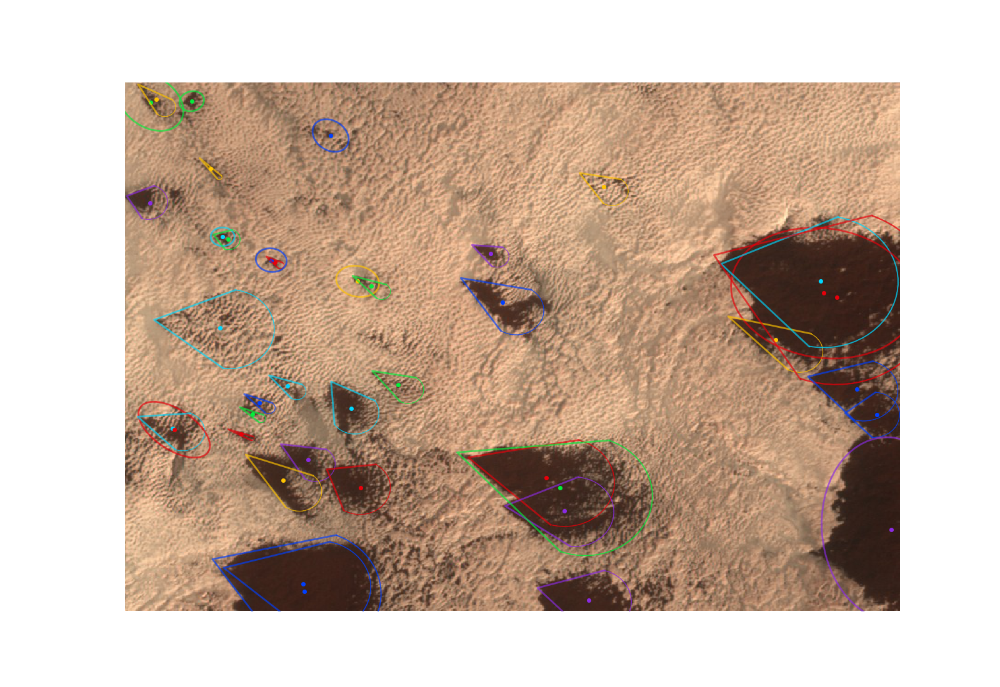

Entering markings.plot_objects
Received 31 objects to plot.
Plotting background image.
Found image in cache.
Entering markings.plot_objects
Received 9 objects to plot.
Plotting background image.
Found image in cache.


In [127]:
plot_finals('bz7', obsid=obsid)

In [120]:
pm = io.PathManager('c0a', obsid=obsid)

In [121]:
all([pm.final_fanfile.exists(),
     pm.final_blotchfile.exists()])

True

In [122]:
pm.final_blotchfile.parent.parent

PosixPath('/Users/klay6683/Dropbox/data/planet4/clustering/ESP_012858_0855/APF0000c0a')

In [20]:
cut

,x_tile,y_tile,x,y,image_x,image_y,radius_1,radius_2,distance,angle,spread,version,x_angle,y_angle,n_votes,image_id,image_name,vote_ratio
fan,2.0,35.0,376.100000,199.135001,1116.100000,18831.135001,NaN,NaN,43.653786,27.611537,45.894341,1.0,0.884359,0.462558,10,APF0000bz7,ESP_012858_0855,0.769231
fan,2.0,35.0,223.796297,366.111111,963.796297,18998.111111,NaN,NaN,75.213005,60.400975,58.970445,1.0,0.490620,0.863682,9,APF0000bz7,ESP_012858_0855,0.750000
fan,2.0,35.0,95.833333,186.333333,835.833333,18818.333333,NaN,NaN,30.084353,20.002190,70.719019,1.0,0.938237,0.341531,3,APF0000bz7,ESP_012858_0855,0.500000
blotch,2.0,35.0,105.833333,189.000000,845.833333,18821.000000,12.893847,11.337052,NaN,1.260916,NaN,NaN,0.099167,0.402018,3,APF0000bz7,ESP_012858_0855,0.500000
fan,2.0,35.0,153.166667,213.333333,893.166667,18845.333333,NaN,NaN,22.668647,35.195680,24.752997,1.0,0.813440,0.573727,3,APF0000bz7,ESP_012858_0855,0.500000
blotch,2.0,35.0,158.500000,217.666667,898.500000,18849.666667,16.870152,14.319281,NaN,14.399430,NaN,NaN,0.873568,0.261349,3,APF0000bz7,ESP_012858_0855,0.500000
fan,2.0,35.0,14.000000,2.000000,754.000000,18634.000000,NaN,NaN,48.918299,49.144624,10.434250,1.0,0.654152,0.756363,1,APF0000bz7,ESP_012858_0855,0.500000
blotch,2.0,35.0,32.000000,25.000000,772.000000,18657.000000,39.812058,29.859044,NaN,64.722278,NaN,NaN,0.427006,0.904249,1,APF0000bz7,ESP_012858_0855,0.500000


In [21]:
cut.loc['fan']

,x_tile,y_tile,x,y,image_x,image_y,radius_1,radius_2,distance,angle,spread,version,x_angle,y_angle,n_votes,image_id,image_name,vote_ratio
fan,2.0,35.0,376.100000,199.135001,1116.100000,18831.135001,NaN,NaN,43.653786,27.611537,45.894341,1.0,0.884359,0.462558,10,APF0000bz7,ESP_012858_0855,0.769231
fan,2.0,35.0,223.796297,366.111111,963.796297,18998.111111,NaN,NaN,75.213005,60.400975,58.970445,1.0,0.490620,0.863682,9,APF0000bz7,ESP_012858_0855,0.750000
fan,2.0,35.0,95.833333,186.333333,835.833333,18818.333333,NaN,NaN,30.084353,20.002190,70.719019,1.0,0.938237,0.341531,3,APF0000bz7,ESP_012858_0855,0.500000
fan,2.0,35.0,153.166667,213.333333,893.166667,18845.333333,NaN,NaN,22.668647,35.195680,24.752997,1.0,0.813440,0.573727,3,APF0000bz7,ESP_012858_0855,0.500000
fan,2.0,35.0,14.000000,2.000000,754.000000,18634.000000,NaN,NaN,48.918299,49.144624,10.434250,1.0,0.654152,0.756363,1,APF0000bz7,ESP_012858_0855,0.500000


In [22]:
new_fans = cut.loc['fan']

In [23]:
new_fans.to_csv?

In [17]:
paths = pm.get_obsid_paths('L1B')

In [18]:
paths[0]

PosixPath('/Users/klay6683/Dropbox/data/planet4/clustering/ESP_012858_0855/APF0000bz6/L1B')

In [384]:
id_ = get_id_from_path(paths[0])
id_

'APF0000bb6'

In [7]:
p4id = markings.ImageID('bz7')

In [7]:
%matplotlib inline

In [5]:
scanner = dbscan.DBScanner()

Skipping due to lack of data.


<IPython.core.display.Javascript object>


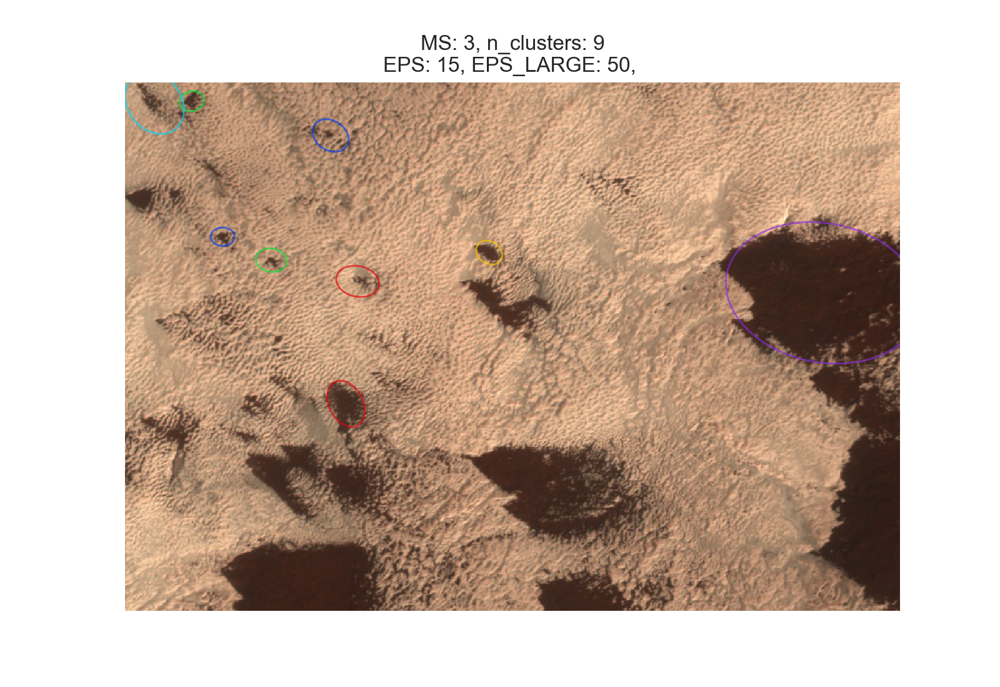

In [6]:
scanner.cluster_and_plot('bz7', 'blotch')

<IPython.core.display.Javascript object>


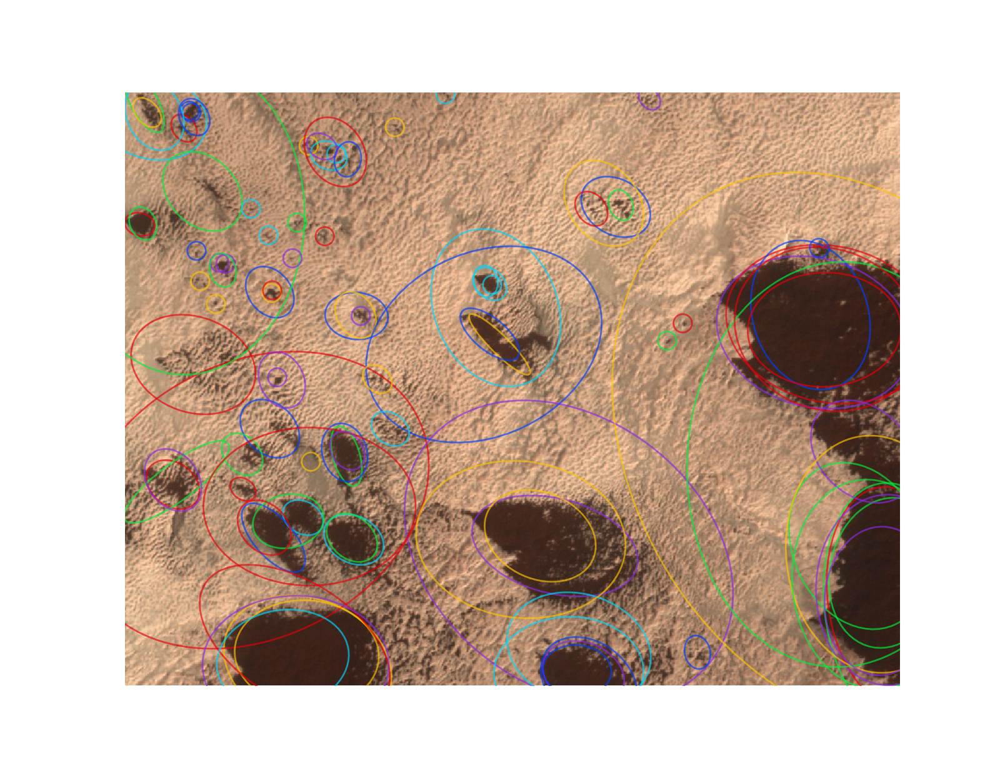

In [11]:
p4id.plot_blotches()

<IPython.core.display.Javascript object>


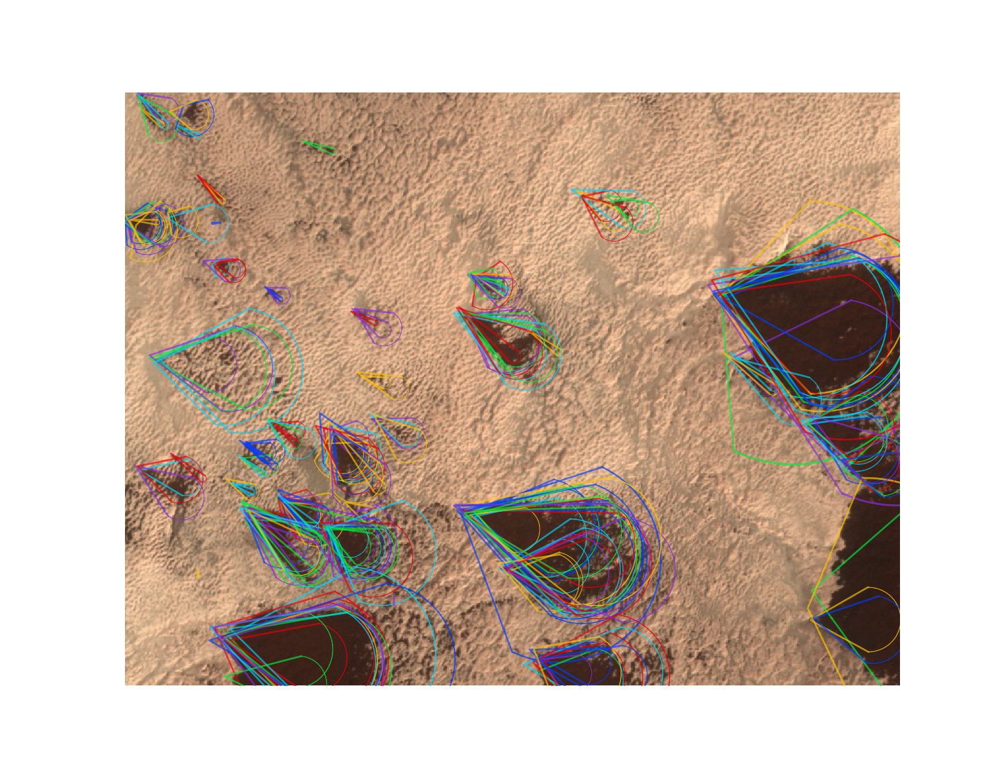

In [12]:
p4id.plot_fans()

In [367]:
pm = io.PathManager('b', obsid=obsid)

In [368]:
pm.blotchfile

PosixPath('/Users/klay6683/Dropbox/data/planet4/clustering/ESP_012858_0855/APF0000bb6/APF0000bb6_blotches.csv')

In [369]:
pm.reduced_blotchfile

PosixPath('/Users/klay6683/Dropbox/data/planet4/clustering/ESP_012858_0855/APF0000bb6/L1A/L1A_APF0000bb6_blotches.csv')

In [68]:
arr1 =np.array([[0,0], [1,1]])
arr2 = np.array([[1,1], [2, 2],[3,3]])
arr2.shape

(3, 2)

In [69]:
cdist(arr1, arr2)

array([[ 1.41421356,  2.82842712,  4.24264069],
       [ 0.        ,  1.41421356,  2.82842712]])

In [1]:
imgid = markings.ImageID('10k')

NameError: name 'markings' is not defined

<IPython.core.display.Javascript object>


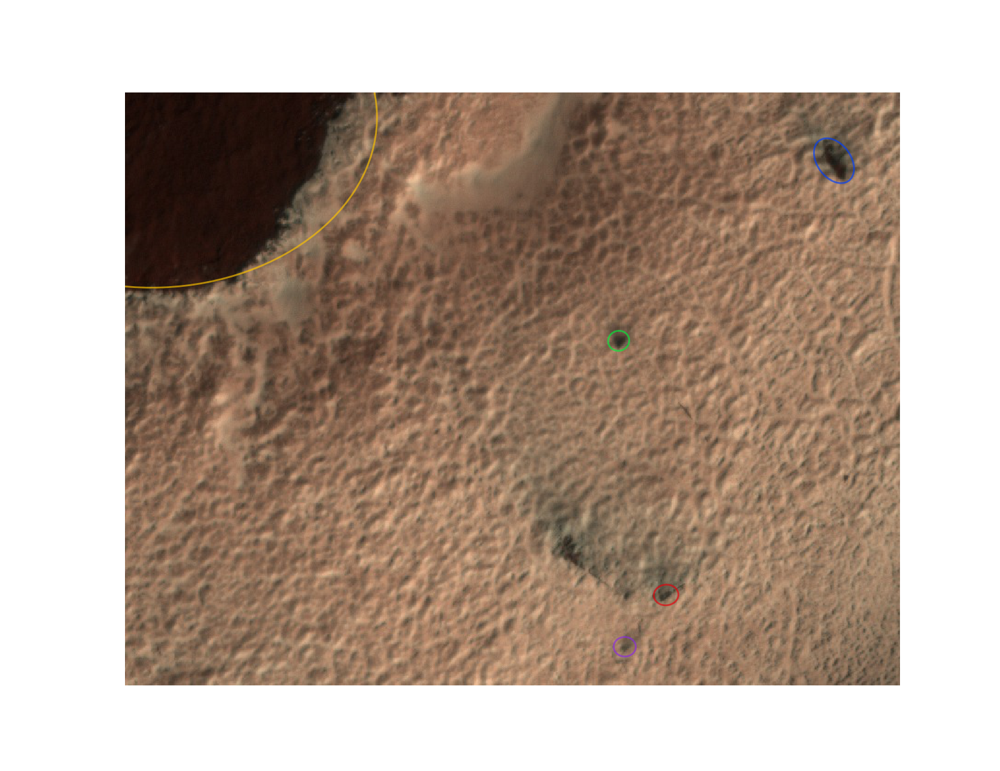

In [11]:
imgid.plot_blotches(data=blotches)

<IPython.core.display.Javascript object>


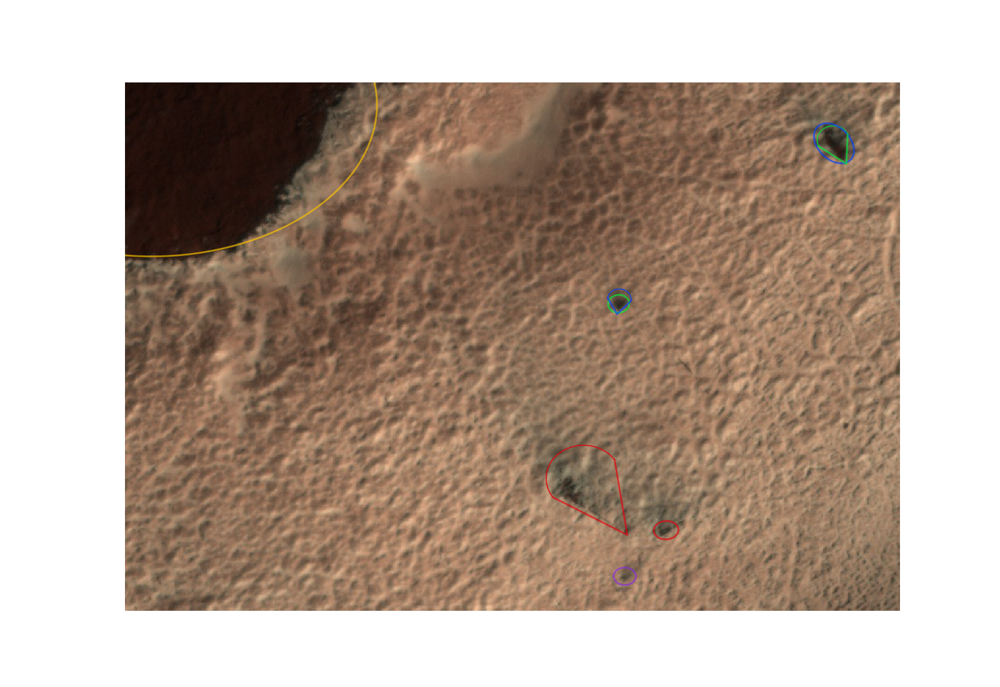

In [12]:
fig, ax = plt.subplots()
imgid.plot_fans(data=fans, ax=ax)
imgid.plot_blotches(data=blotches,ax=ax)

In [ ]:


@property
def confusion_data(self):
    return pd.DataFrame(self.confusion, columns=['image_name', 'kind',
                                                 'n_markings',
                                                 'n_cluster_members',
                                                 'n_rejected'])


def get_newfans_newblotches(self):
    logging.debug("Executing get_newfans_newblotches")
    df = self.pm.fnotchdf

    # check if we got a fnotch dataframe. If not, we assume none were found.
    if df is None:
        logging.debug("No fnotches found on disk.")
        self.newfans = []
        self.newblotches = []
        return

    # apply Fnotch method `get_marking` with given cut.
    fnotches = df.apply(markings.Fnotch.from_series, axis=1,
                        args=('hirise',))
    final_clusters = fnotches.apply(lambda x: x.get_marking(self.cut))

    def filter_for_fans(x):
        if isinstance(x, markings.Fan):
            return x

    def filter_for_blotches(x):
        if isinstance(x, markings.Blotch):
            return x

    # now need to filter for whatever object was returned by Fnotch.get_marking
    self.newfans = final_clusters[
        final_clusters.apply(filter_for_fans).notnull()]
    self.newblotches = final_clusters[
        final_clusters.apply(filter_for_blotches).notnull()]

def apply_fnotch_cut(self, cut=None):
    logging.debug("Executing apply_fnotch_cut")
    if cut is None:
        cut = self.cut

    # storage path for the final catalog after applying `cut`
    # PathManager self.pm is doing that.
    self.pm.get_cut_folder(cut)

    self.get_newfans_newblotches()

    if len(self.newfans) > 0:
        newfans = self.newfans.apply(lambda x: x.store())
        try:
            completefans = pd.DataFrame(
                self.pm.fandf).append(newfans, ignore_index=True)
        except OSError:
            completefans = newfans
        logging.debug("No of fans now: %i" % len(completefans))
    else:
        logging.debug("Apply fnotch cut: No new fans found.")
        completefans = self.pm.fandf
    if len(self.newblotches) > 0:
        newblotches = self.newblotches.apply(lambda x: x.store())
        try:
            completeblotches = pd.DataFrame(
                self.pm.blotchdf).append(newblotches, ignore_index=True)
        except OSError:
            completeblotches = newblotches
        logging.debug("No of blotches now: %i" % len(completeblotches))
    else:
        logging.debug('Apply fnotch cut: no blotches survived.')
        completeblotches = self.pm.blotchdf
    self.save(completefans, self.pm.final_fanfile)
    self.save(completeblotches, self.final_blotchfile)
    logging.debug("Finished apply_fnotch_cut.")

def save(self, obj, path):
    try:
        if self.output_format in ['hdf', 'both']:
            obj.to_hdf(str(path.with_suffix('.hdf')), 'df')
        if self.output_format in ['csv', 'both']:
            obj.to_csv(str(path.with_suffix('.csv')), index=False)
    # obj could be NoneType if no blotches or fans were found. Catching it here.
    except AttributeError:
        pass

def save_confusion_data(self, fname):
    self.confusion_data.to_csv(fname)

######
# Functions
#####

def calc_fnotch(nfans, nblotches):
    """Calculate the fnotch value (or fan-ness)."""
    return (nfans) / (nfans + nblotches)


def gold_star_plotter(gold_id, axis, kind='blotches'):
    """Plot gold data."""
    for goldstar, color in zip(markings.gold_members,
                               markings.gold_plot_colors):
        if kind == 'blotches':
            gold_id.plot_blotches(user_name=goldstar, ax=axis,
                                  user_color=color)
        if kind == 'fans':
            gold_id.plot_fans(user_name=goldstar, ax=axis, user_color=color)
        markings.gold_legend(axis)


def is_catalog_production_good():
    """A simple quality check for the catalog production."""
    from pandas.core.index import InvalidIndexError
    db = io.DBManager(io.get_current_database_fname())
    not_there = []
    invalid_index = []
    value_error = []
    for image_name in db.image_names:
        try:
            io.PathManager(image_name)
        except InvalidIndexError:
            invalid_index.append(image_name)
        except ValueError:
            value_error.append(image_name)
    if len(value_error) == 0 and len(not_there) == 0 and\
            len(invalid_index) == 0:
        return True
    else:
        return False

